In [42]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [43]:
landscape_original = cv2.imread("../assets/landscape2.jpeg", 1)

width=700
height=550

landscape=cv2.resize(landscape_original, (width, height))

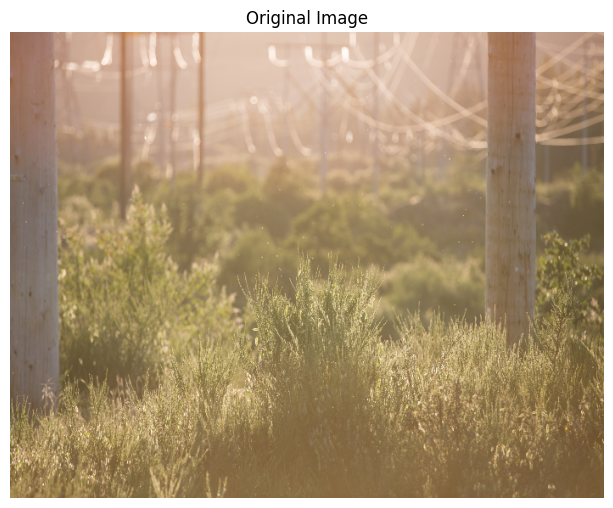

In [60]:
plt.figure(figsize=(20,10))
plt.subplot(2,2,1)
plt.imshow(cv2.cvtColor(landscape, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

plt.tight_layout()
plt.show()

# BGR Channel Split

In [45]:
b,g,r=cv2.split(landscape)

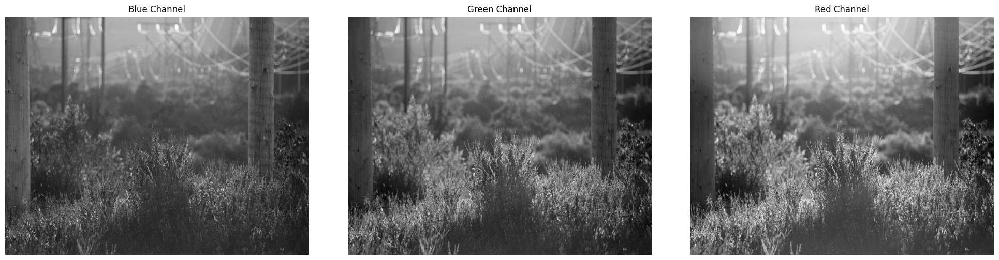

In [46]:
plt.figure(figsize=(20, 5))
plt.subplot(1, 3, 1)
plt.imshow(b, cmap='gray')
plt.title("Blue Channel")
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(g, cmap='gray')
plt.title("Green Channel")
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(r, cmap='gray')
plt.title("Red Channel")
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
def histogram_equalization(image):
    M,N=image.shape
    total_pixels = M*N
    L=256
    # histogram = np.zeros(L, dtype=np.int32)
    # for i in range(M):
    #     for j in range(N):
    #         pixel_intensity=image[i,j]
    #         histogram[pixel_intensity] += 1
    histogram=cv2.calcHist([image], [0], None, [256], [0,256]).flatten()

    probability=np.zeros(L, dtype=np.float32)
    for i in range(L):
        probability[i] = histogram[i]/total_pixels
    
    cumulative_sum_array=np.zeros(L, dtype=np.float32)
    transformation_fn=np.zeros(L, dtype=np.int32)
    for i in range(L):
        cumulative_sum=0.0
        for j in range(i+1):
            cumulative_sum += probability[j]
        cumulative_sum_array[i] = cumulative_sum
        transformation_fn[i] = round((L-1)*cumulative_sum)
        if transformation_fn[i]>255:
            transformation_fn[i]=255

    equalized_image=np.zeros_like(image)
    # for i in range(M):
    #     for j in range(N):
    #         old_value=image[i,j]
    #         new_value=transformation_fn[old_value]
    #         equalized_image[i,j]=new_value
    equalized_image = cv2.LUT(image, transformation_fn.astype(np.uint8))

    return histogram, probability, cumulative_sum_array, transformation_fn, equalized_image

In [ ]:
hist_b, prob_b, cum_sum_array_b, trans_fn_b, equalized_b = histogram_equalization(b)

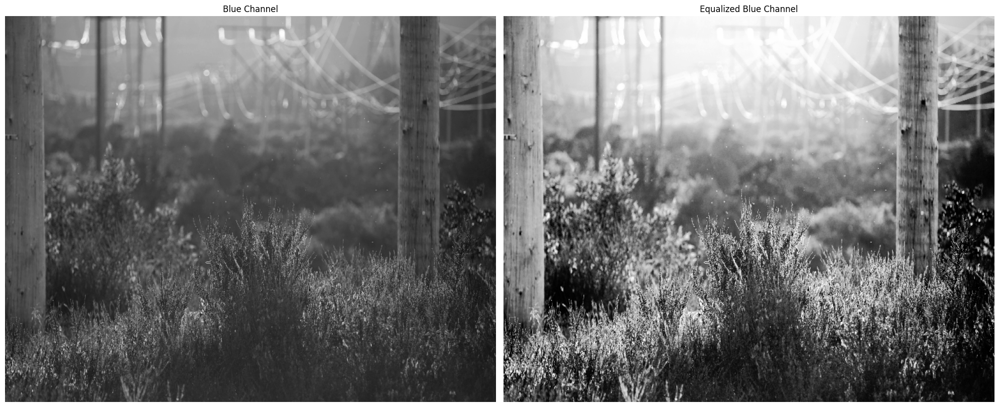

In [49]:
plt.figure(figsize=(20,15))
plt.subplot(1,2,1)
plt.imshow(b, cmap='gray')
plt.title("Blue Channel")
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(equalized_b, cmap='gray')
plt.title("Equalized Blue Channel")
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
hist_g, prob_g, cum_sum_array_g, trans_fn_g, equalized_g = histogram_equalization(g)

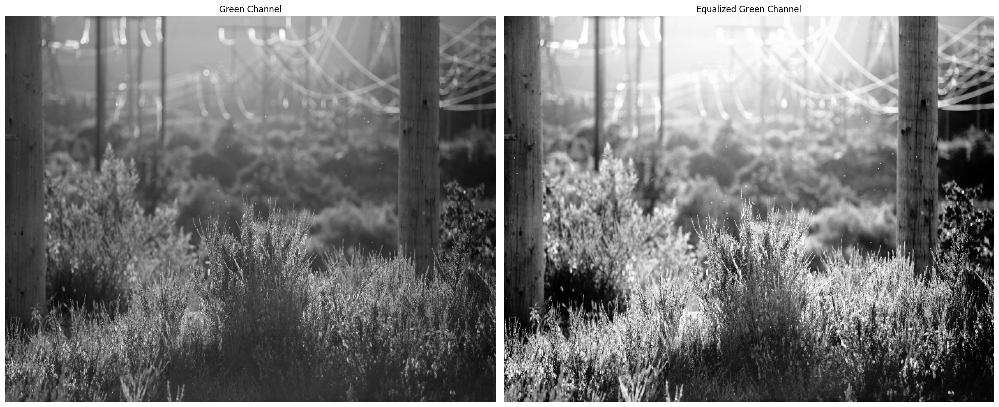

In [51]:
plt.figure(figsize=(20,15))
plt.subplot(1,2,1)
plt.imshow(g, cmap='gray')
plt.title("Green Channel")
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(equalized_g, cmap='gray')
plt.title("Equalized Green Channel")
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
hist_r, prob_r, cum_sum_array_r, trans_fn_r, equalized_r = histogram_equalization(r)

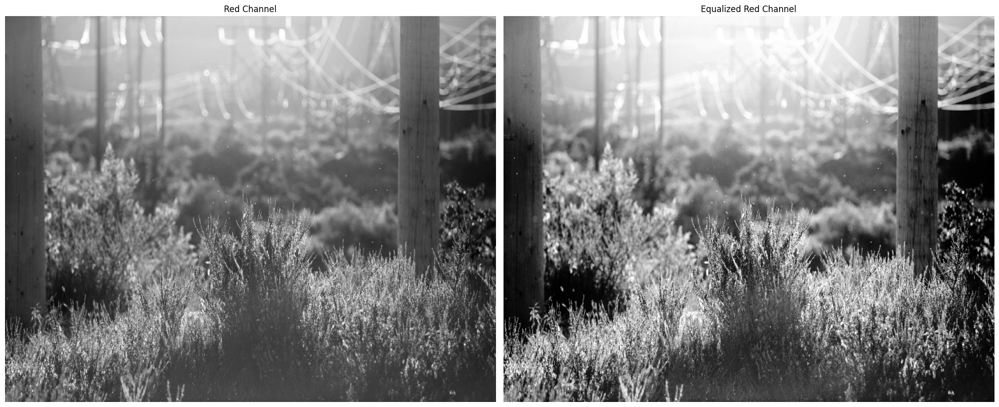

In [53]:
plt.figure(figsize=(20,15))
plt.subplot(1,2,1)
plt.imshow(r, cmap='gray')
plt.title("Red Channel")
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(equalized_r, cmap='gray')
plt.title("Equalized Red Channel")
plt.axis('off')

plt.tight_layout()
plt.show()

In [54]:
merge_bgr_equ=cv2.merge((equalized_b, equalized_g, equalized_r))

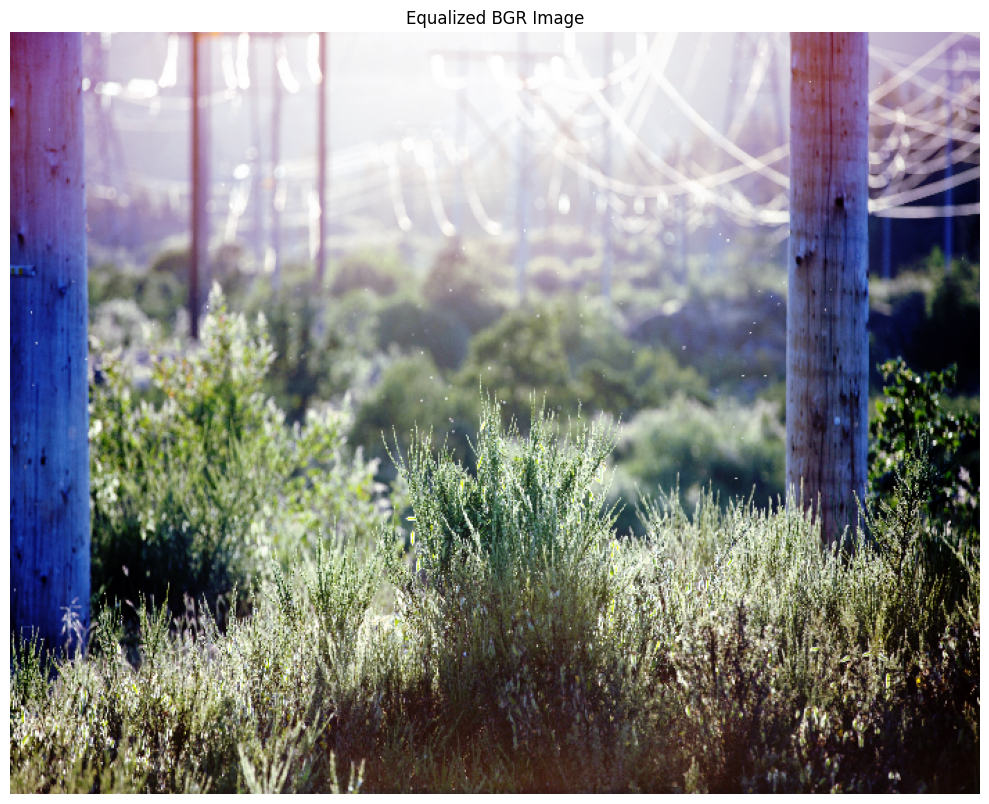

In [55]:
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(merge_bgr_equ, cv2.COLOR_BGR2RGB))
plt.title("Equalized BGR Image")
plt.axis('off')
plt.tight_layout()
plt.show()

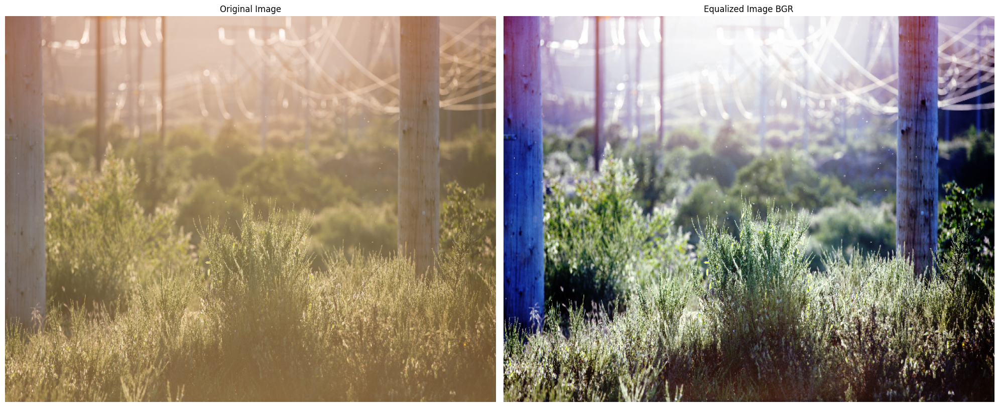

In [56]:
plt.figure(figsize=(20,15))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(landscape, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(merge_bgr_equ, cv2.COLOR_BGR2RGB))
plt.title("Equalized Image BGR")
plt.axis('off')

plt.tight_layout()
plt.show()

# HSV Channel Split

In [57]:
hsv=cv2.cvtColor(landscape, cv2.COLOR_BGR2HSV)

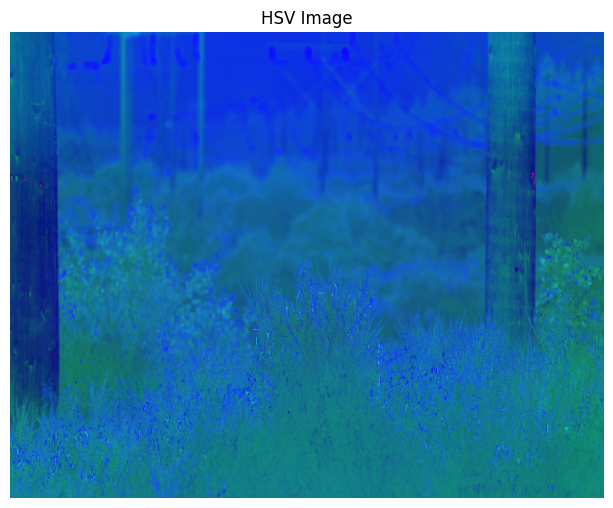

In [59]:
plt.figure(figsize=(20,10))
plt.subplot(2,2,1)
plt.imshow(hsv)
plt.title("HSV Image")
plt.axis('off')

plt.tight_layout()
plt.show()

In [61]:
h,s,v=cv2.split(hsv)

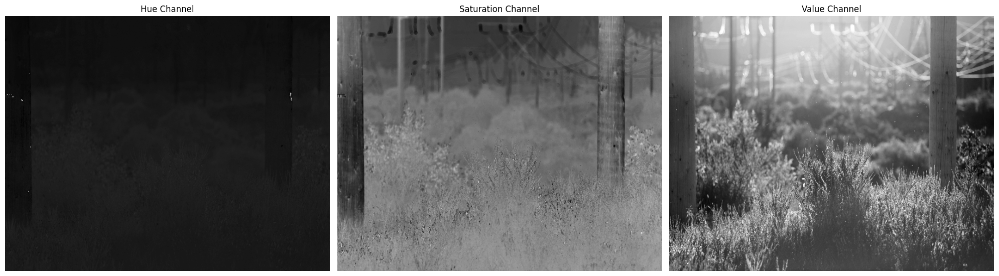

In [65]:
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.imshow(h, cmap='gray')
plt.title("Hue Channel")
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(s, cmap='gray')
plt.title("Saturation Channel")
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(v, cmap='gray')
plt.title("Value Channel")
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
hist_v, prob_v, cum_sum_array_v, trans_fn_v, equalized_v = histogram_equalization(v)

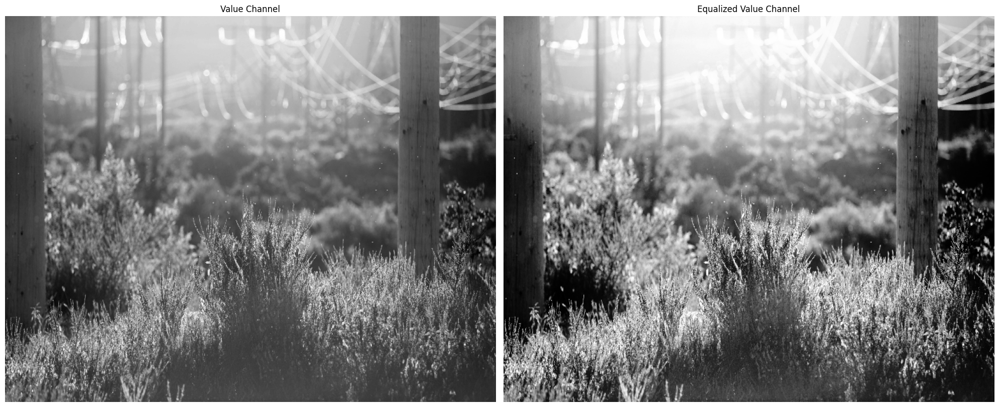

In [68]:
plt.figure(figsize=(20,15))
plt.subplot(1,2,1)
plt.imshow(v, cmap='gray')
plt.title("Value Channel")
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(equalized_v, cmap='gray')
plt.title("Equalized Value Channel")
plt.axis('off')

plt.tight_layout()
plt.show()

In [69]:
hsv_merge_equ=cv2.merge((h, s, equalized_v))

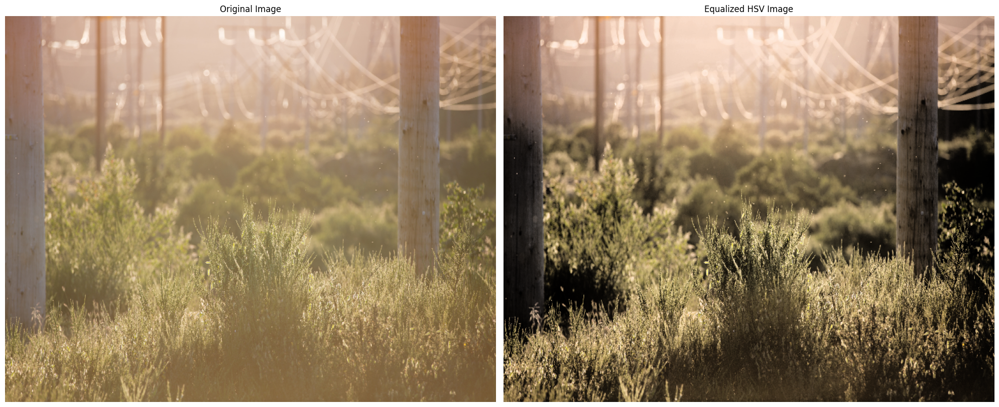

In [72]:
plt.figure(figsize=(20,15))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(landscape, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(hsv_merge_equ, cv2.COLOR_HSV2RGB))
plt.title("Equalized HSV Image")
plt.axis('off')

plt.tight_layout()
plt.show()

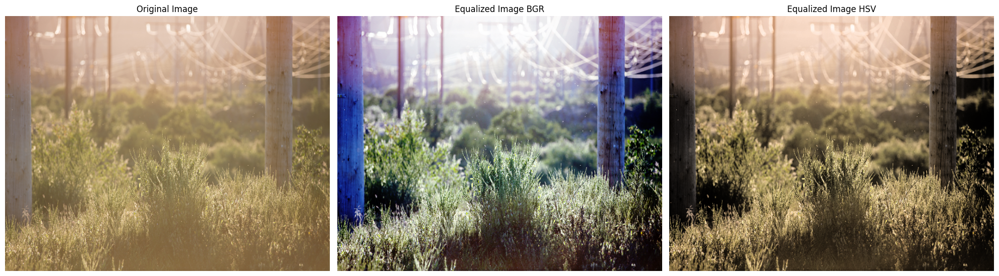

In [71]:
plt.figure(figsize=(20,15))
plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(landscape, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(cv2.cvtColor(merge_bgr_equ, cv2.COLOR_BGR2RGB))
plt.title("Equalized Image BGR")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(hsv_merge_equ, cv2.COLOR_HSV2RGB))
plt.title("Equalized Image HSV")
plt.axis('off')

plt.tight_layout()
plt.show()